In [1]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.axes import Axes
from scipy import signal
from scipy.io import wavfile as wav
import statistics as stats
import sys
import os

# Allows me to import my modules
sys.path.append('./modules')

# The python definition of f(x) for problem 1.
from audio_utils import *

Attempting to read settings file...
	Read successfully!


In [5]:
os.listdir(os.path.join(os.getcwd(), "impulses"))

['180961__kleeb__gunshots.wav',
 '370332__morganpurkis__single-gunshot-2-v2.wav',
 '387477__cosmicembers__distent-gunshot.wav',
 '399269__morganpurkis__simple-gunshot-reverb-test.wav',
 '65752__robinhood76__00762-gunshot-2.wav']

In [2]:
data = get_sample_data("raw")

In [3]:
def plot(title, samples, sample_rate, ylim=None):
    # Plot the signal read from wav file
    
    plt.subplot(211)

    plt.title(title)

    a = plt.plot(samples)
    
    plt.xlabel('Sample')

    plt.ylabel('Amplitude')

    plt.subplot(212)

    plt.specgram(samples, Fs=sample_rate)
    
    plt.ylim((0, int(sample_rate / 2)) if ylim is None else ylim)

    plt.xlabel('Time')

    plt.ylabel('Frequency')

    plt.show()

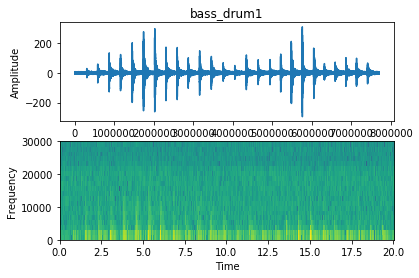

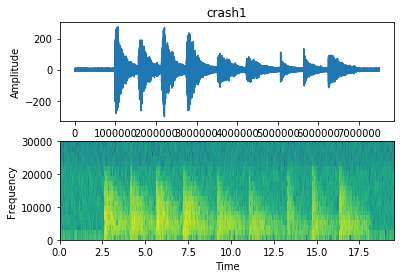

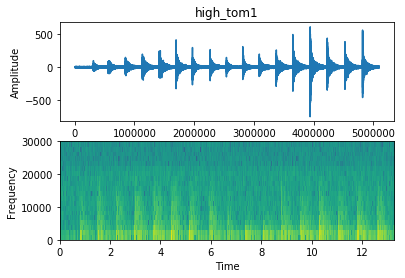

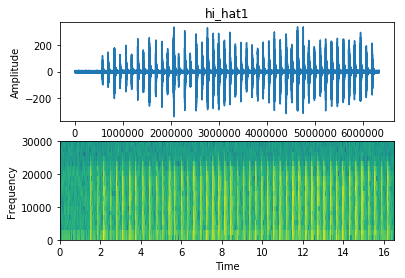

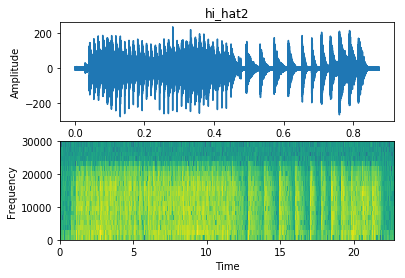

...

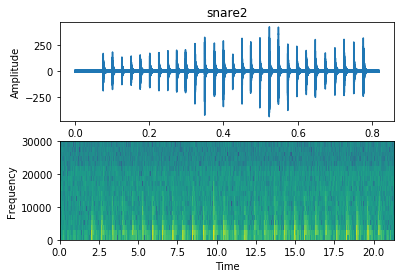

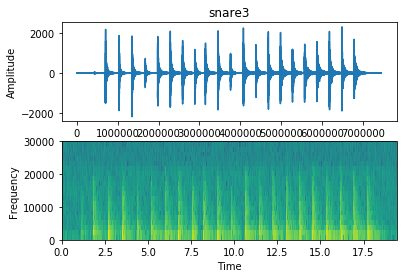

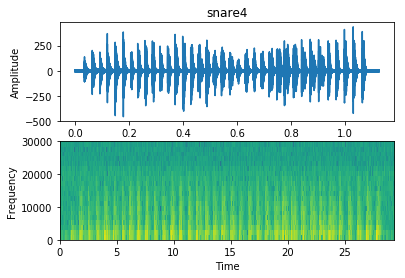

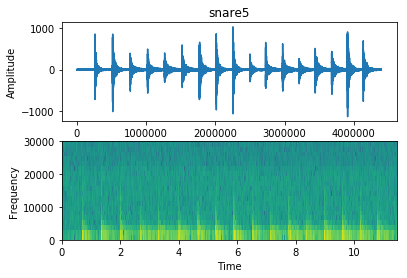

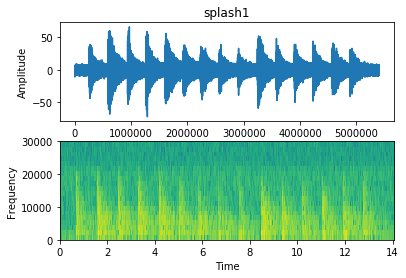

In [4]:
kit_label_count = {kl: 0 for kl in SETTINGS.kit_labels}
for d in data:
    label = d.labels["kit_label"]
    kit_label_count[label] += 1
    # Changes the Frequency (y-limits) to between 0 and 30000
    plot(title=label+str(kit_label_count[label]), samples=d.data, sample_rate=d.rate, ylim=(0, 30000))

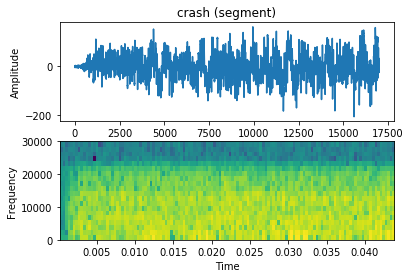

In [4]:
plot("crash (segment)", data[1].data[983000:1000000], data[1].rate, (0, 30000))

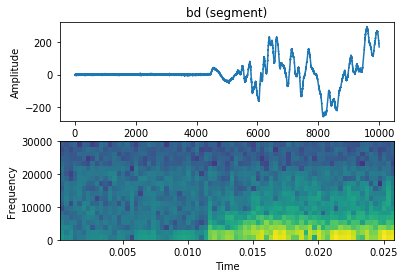

In [6]:
plot("bd (segment)", data[0].data[2015000:2025000], data[0].rate, (0, 30000))

In [4]:
resampled_bd = reduce_sample_rate(data[0], 1000)

c:\users\danzi\appdata\local\programs\python\python35\lib\site-packages\scipy\signal\signaltools.py:2223: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  Y[sl] = X[sl]
c:\users\danzi\appdata\local\programs\python\python35\lib\site-packages\scipy\signal\signaltools.py:2225: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  Y[sl] = X[sl]


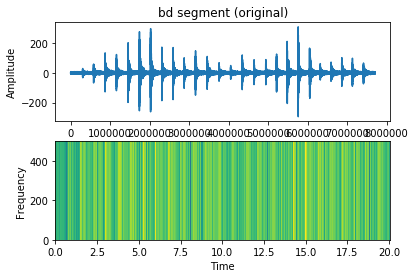

In [6]:
plot("bd segment (original)", data[0].data, data[0].rate, ylim=(0, 500))

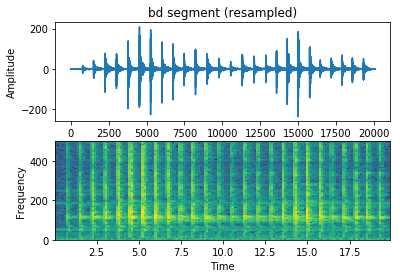

In [9]:
plot("bd segment (resampled)", resampled_bd.data, resampled_bd.rate, ylim=(0, 500))

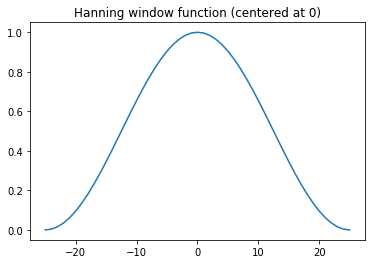

In [10]:
# Energy based novelty
w = np.array(signal.hann(51))
xs = np.array([i for i in range(-25, 26)])
plt.plot(xs, w)
plt.title("Hanning window function (centered at 0)")
plt.show()

In [7]:
start_time = time.time()
bd_local_energy = local_energy_func(resampled_bd.data, 100)
end_time = time.time()
print(round(end_time-start_time, 3))

2.164


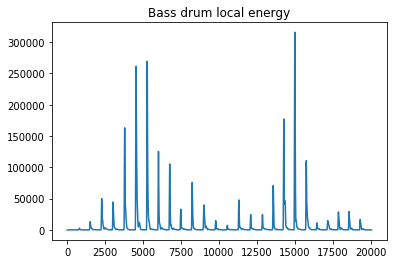

In [8]:
plt.plot(bd_local_energy)
plt.title("Bass drum local energy")
plt.show()

In [13]:
start_time = time.time()
bd_ebn = energy_based_novelty(resampled_bd.data, 100)
end_time = time.time()
print(round(end_time-start_time, 3))

2.358


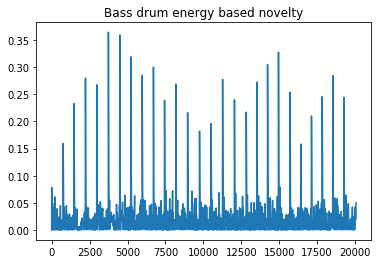

In [14]:
plt.plot(bd_ebn)
plt.title("Bass drum energy based novelty")
plt.show()

In [15]:
stats.stdev(bd_ebn)

0.036511984559853314

In [19]:
def save_figure(title, samples, sample_rate):
    # Plot the signal read from wav file
    plt.subplot(2, 1, 1)

    plt.title(title)

    plt.plot(samples)
    
    plt.xlabel('Sample')

    plt.ylabel('Amplitude')

    plt.subplot(2, 1, 2)

    plt.specgram(samples, Fs=sample_rate)
    
    plt.ylim((0, 30000))

    plt.xlabel('Time')

    plt.ylabel('Frequency')

    plt.savefig(title+".pdf")
    
    plt.close()

In [4]:
data_indices = [1, 2, 3, 4, 5, 6, 7, 8, 9, 14]
resampled_data = [reduce_sample_rate(data[i], SETTINGS.cropping["down_sampling_rate"]) for i in data_indices]
cs_resampled = resampled_data[0]
ht_resampled = resampled_data[1]
hhc_resampled = resampled_data[2]
hho_resampled = resampled_data[3]
lt_resampled = resampled_data[4]
mt_resampled = resampled_data[5]
rs_resampled = resampled_data[6]
rsb_resampled = resampled_data[7]
s_resampled = resampled_data[8]
ss_resampled = resampled_data[9]


c:\users\danzi\appdata\local\programs\python\python35\lib\site-packages\scipy\signal\signaltools.py:2223: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  Y[sl] = X[sl]
c:\users\danzi\appdata\local\programs\python\python35\lib\site-packages\scipy\signal\signaltools.py:2225: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  Y[sl] = X[sl]
c:\users\danzi\appdata\local\programs\python\python35\lib\site-packages\scipy\signal\signaltools.py:2230: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)

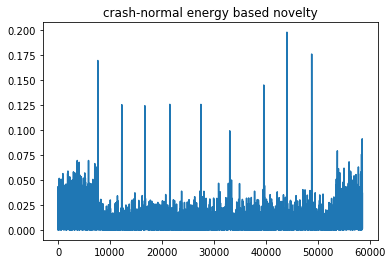

SD: 0.013 	Mean: 0.013


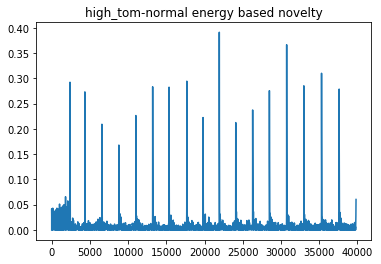

SD: 0.022 	Mean: 0.009


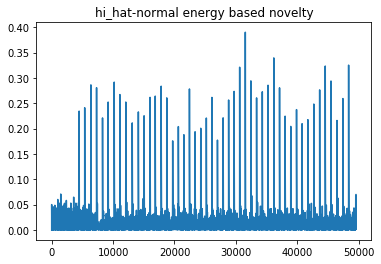

SD: 0.031 	Mean: 0.02


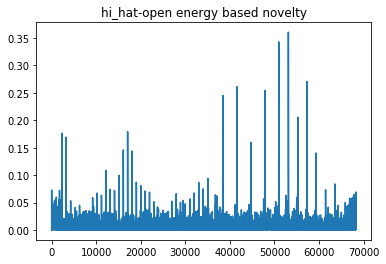

SD: 0.016 	Mean: 0.013


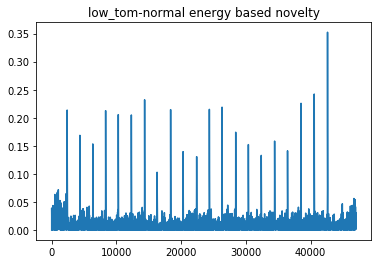

SD: 0.018 	Mean: 0.012


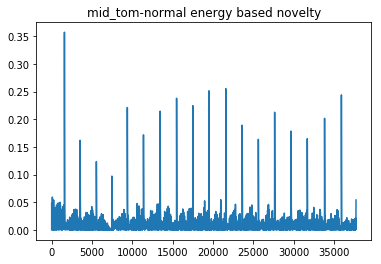

SD: 0.02 	Mean: 0.014


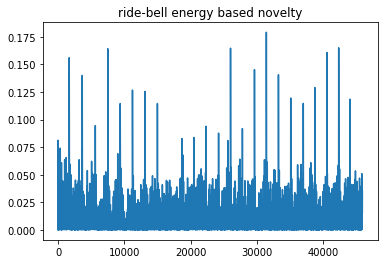

SD: 0.016 	Mean: 0.017


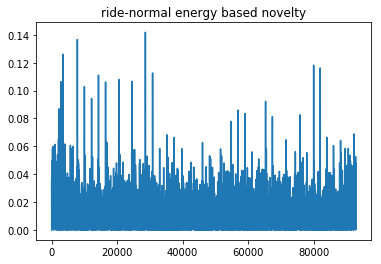

SD: 0.012 	Mean: 0.014


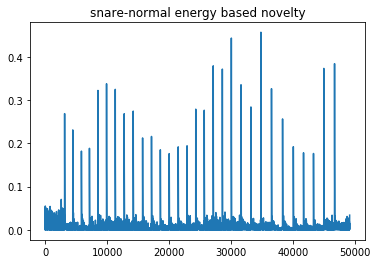

SD: 0.027 	Mean: 0.013


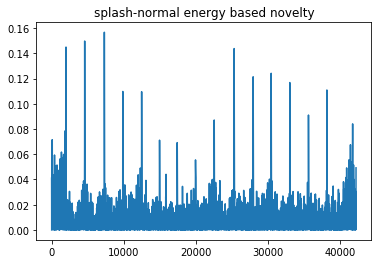

SD: 0.013 	Mean: 0.012


In [21]:
for rd in resampled_data:
    start_time = time.time()
    rd_ebn = energy_based_novelty(rd.data, 100)
    end_time = time.time()
    plt.plot(rd_ebn)
    plt.title("{}-{} energy based novelty".format(rd.labels["kit_label"], rd.labels["tech_label"]))
    plt.show()
    print("SD:", round(stats.stdev(rd_ebn), 3), "\tMean:", round(np.average(rd_ebn), 3), "\nExecution time: ", round(end_time-start_time, 3))

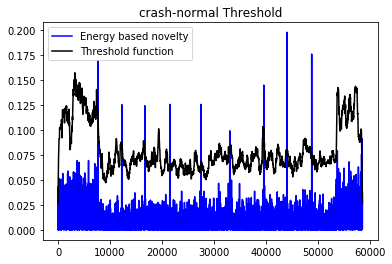

Execution time: 11.678


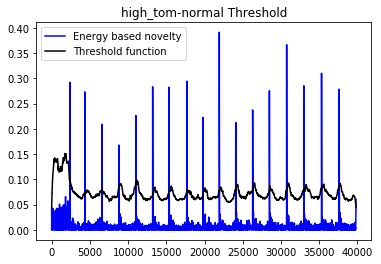

Execution time: 7.962


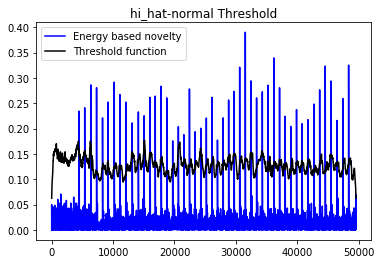

Execution time: 10.016


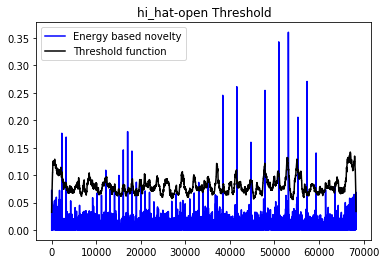

Execution time: 13.392


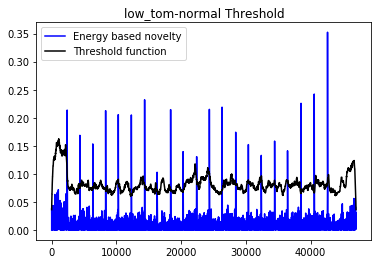

Execution time: 9.333


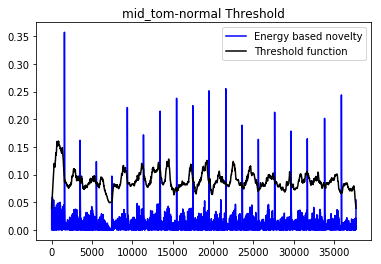

Execution time: 7.524


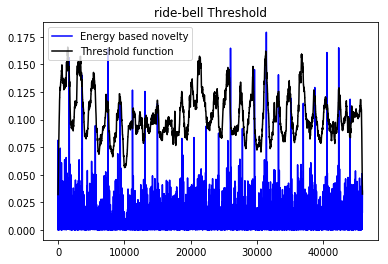

Execution time: 9.234


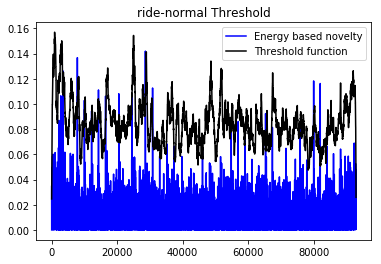

Execution time: 18.365


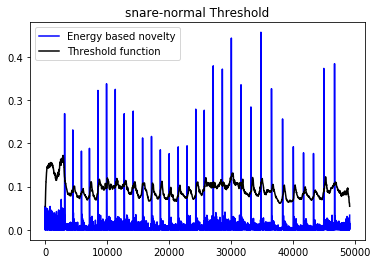

Execution time: 9.705


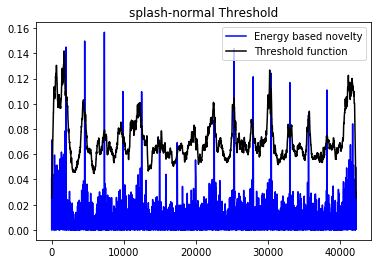

Execution time: 8.31


In [6]:
for rd in resampled_data:
    start_time = time.time()
    rd_ebn = energy_based_novelty(rd.data, 100)
    rd_ebn_tf = threshold_func(rd_ebn, int(SETTINGS.cropping["down_sampling_rate"]/5), 2*stats.stdev(rd_ebn), 5)
    end_time = time.time()
    plt.plot(rd_ebn, color="blue")
    plt.plot(rd_ebn_tf, color="black")
    plt.legend(["Energy based novelty", "Threshold function"])
    plt.title("{}-{} Threshold".format(rd.labels["kit_label"], rd.labels["tech_label"]))
    plt.show()
    print("Execution time:", round(end_time-start_time, 3))

In [7]:
rd_onsets_c1_1sd = []
rd_onsets_c1_2sd = []
for rd in resampled_data:
    start_time = time.time()
    rd_ebn = energy_based_novelty(rd.data, 100)
    rd_ebn_tf = threshold_func(rd_ebn, 1000, stats.stdev(rd_ebn), 5)
    rd_onsets_c1_1sd.append(onset_detection(rd_ebn, rd_ebn_tf))
    rd_ebn_tf = threshold_func(rd_ebn, 1000, 2*stats.stdev(rd_ebn), 5)
    rd_onsets_c1_2sd.append(onset_detection(rd_ebn, rd_ebn_tf))
    end_time = time.time()
    print("Execution time:", round(end_time - start_time, 3))

Execution time: 15.403
Execution time: 10.447
Execution time: 12.914
Execution time: 17.837
Execution time: 12.345
Execution time: 9.902
Execution time: 12.006
Execution time: 24.324
Execution time: 13.124
Execution time: 11.042


In [9]:
for onset_i in range(len(resampled_data)):
    print(len(rd_onsets_c1_1sd[onset_i]), len(rd_onsets_c1_2sd[onset_i]))

10 10
17 17
47 47
32 22
21 21
17 17
20 15
24 15
30 30
14 14


[ 980224 1571200 2139776 2755072 3521024 4230400 4232192 5070464 5641472
 6251776]


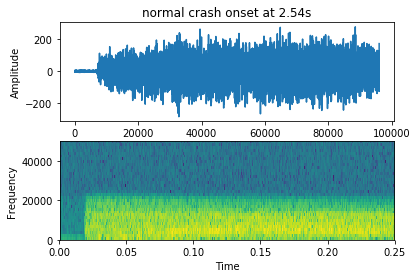

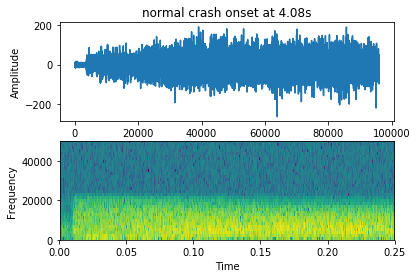

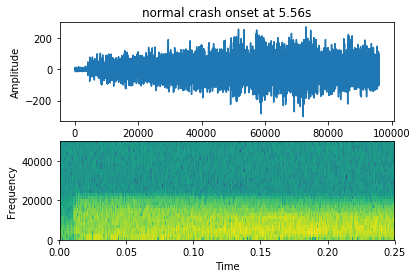

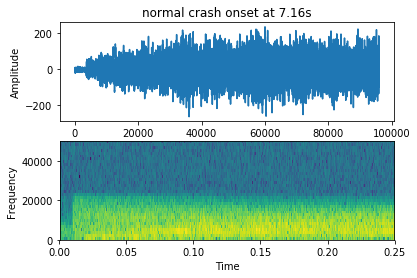

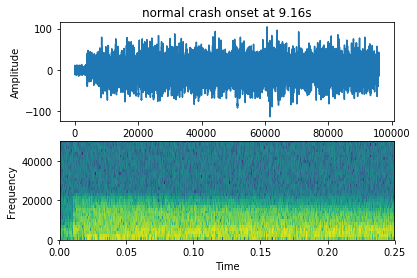

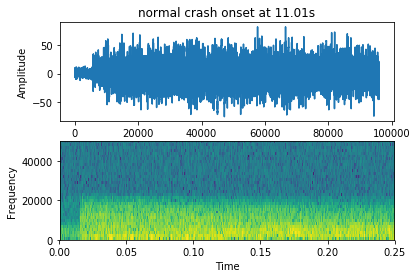

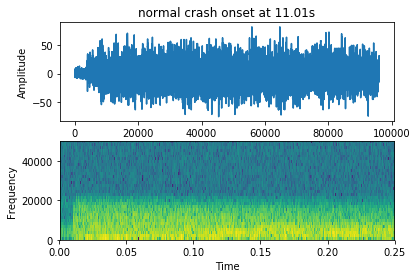

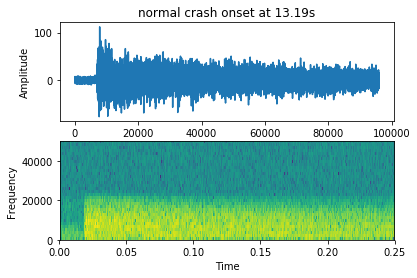

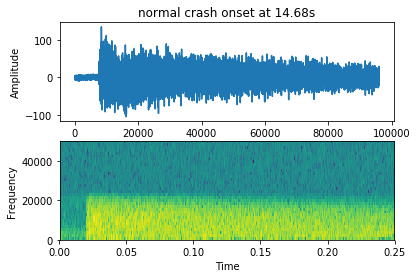

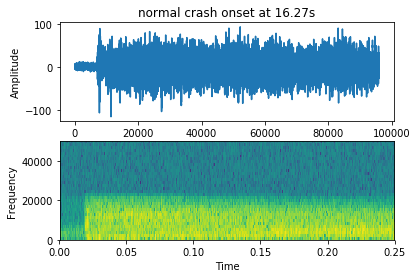

[ 306944  556160  841472 1125632 1409920 1691648 1966080 2263424 2535552
 2807936 3083392 3366528 3646976 3936128 4223872 4520448 4815488]


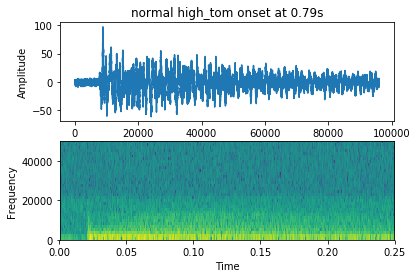

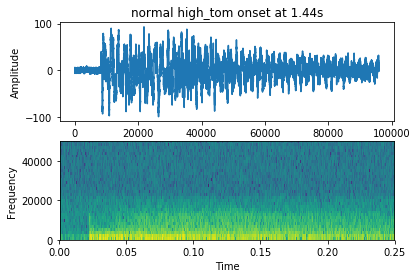

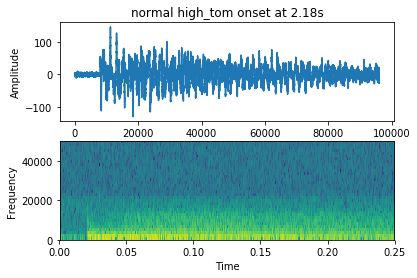

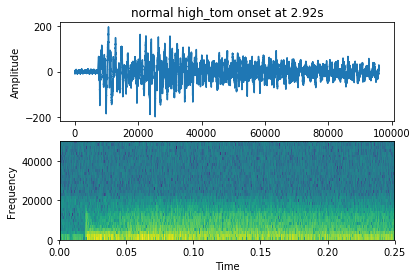

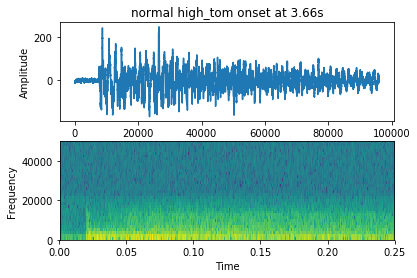

...

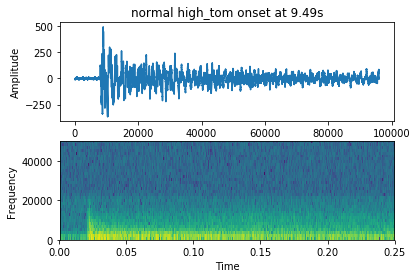

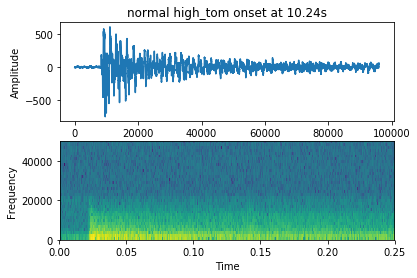

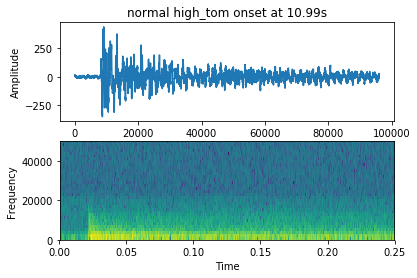

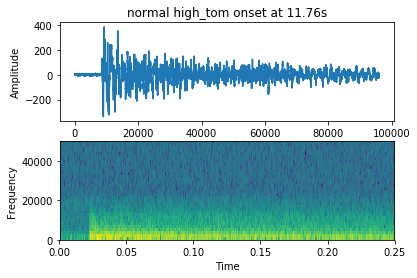

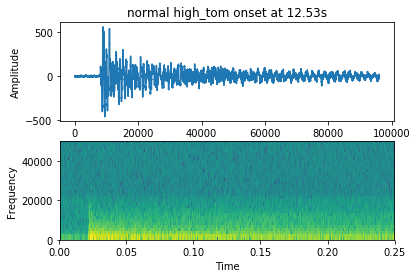

[ 572416  688512  817536  935680 1060096 1177088 1304064 1421952 1545088
 1679488 1806976 1926272 2050432 2159232 2282880 2398720 2522240 2640640
 2755840 2871680 2989312 3107328 3223808 3340160 3455616 3573632 3688320
 3803008 3918464 4036224 4152064 4271104 4390400 4509824 4630016 4749568
 4865920 4983680 5103744 5219584 5340288 5463808 5585792 5702528 5821952
 5946752 6069760]


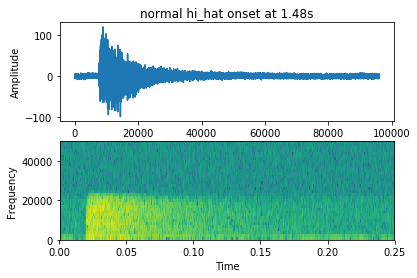

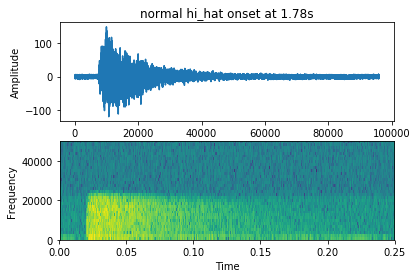

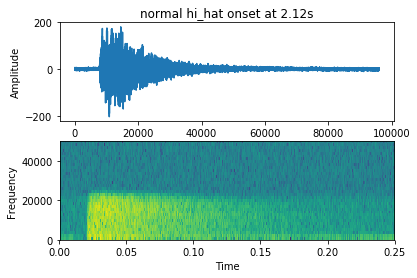

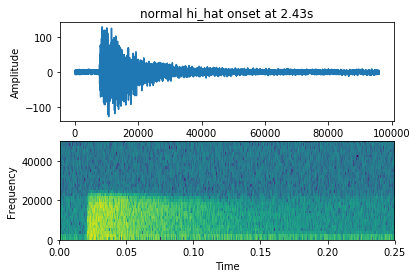

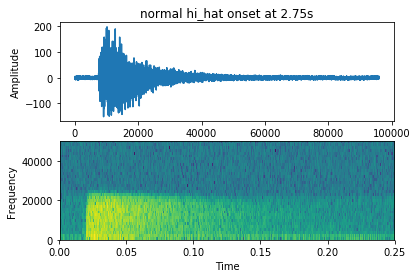

...

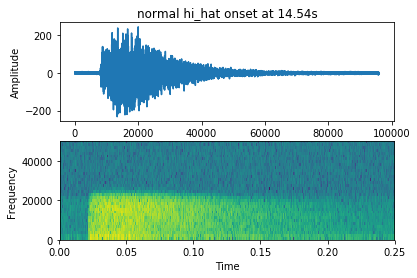

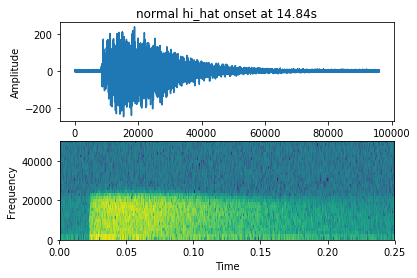

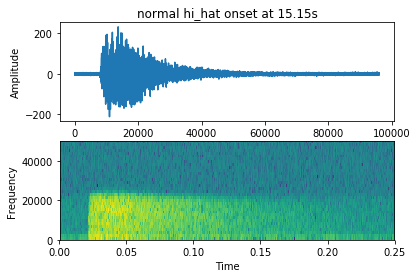

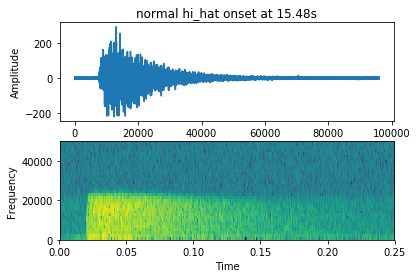

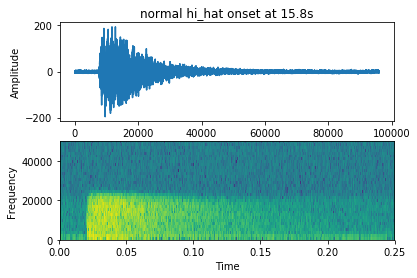

[ 291840  415744 1553792 1932416 2057344 2181632 2305536 2432384 2559616
 4223872 4485888 4914304 5317120 5723520 6127232 6522496 6798848 7074304
 7335680 7594240 7867264 8136064]


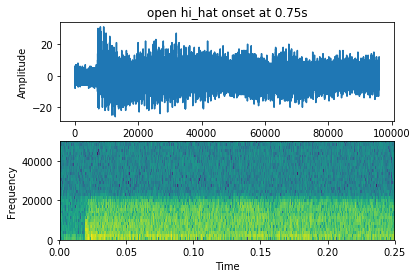

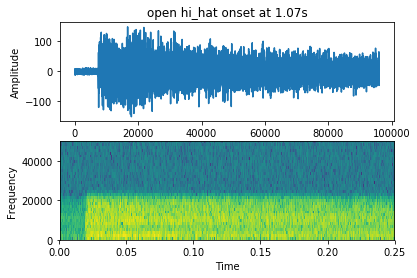

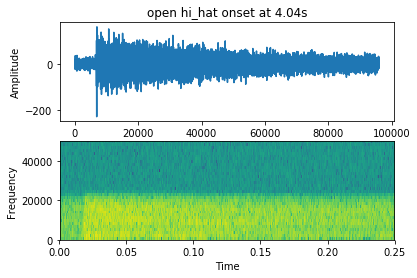

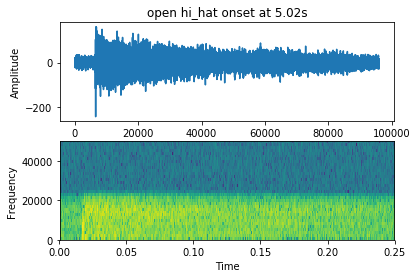

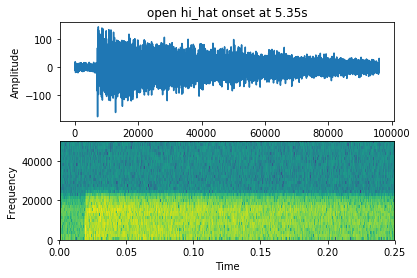

...

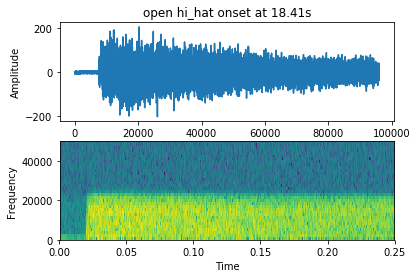

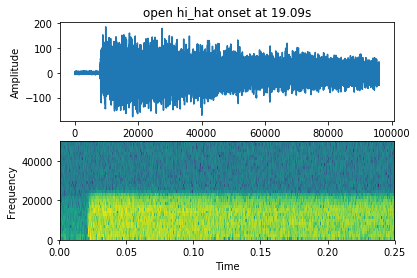

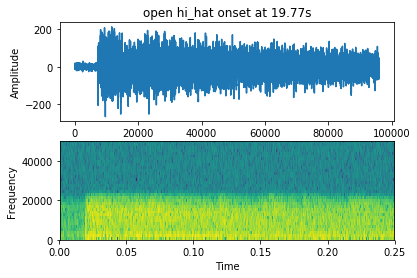

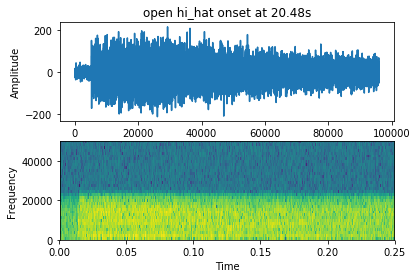

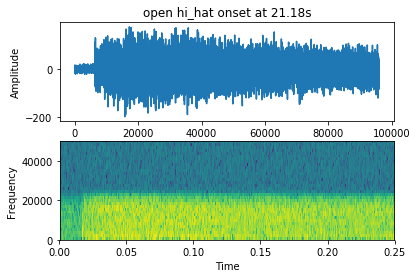

[ 306688  558336  813568 1067264 1317760 1575936 1838464 2085120 2352896
 2599296 2867840 3119104 3370112 3640320 3890560 4145536 4409856 4665344
 4932224 5193472 5456384]


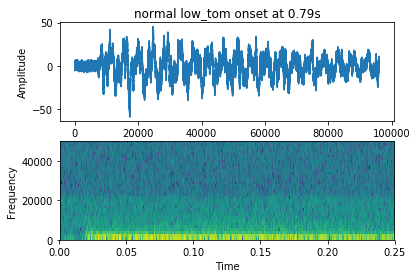

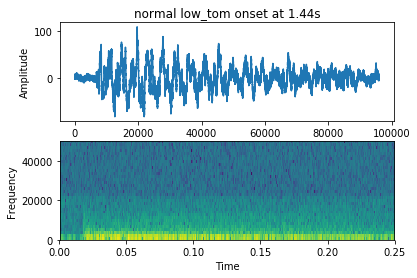

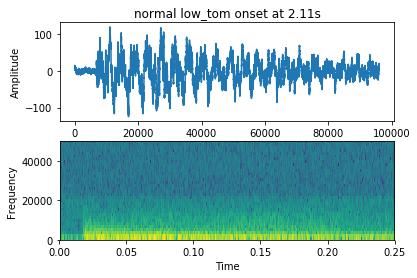

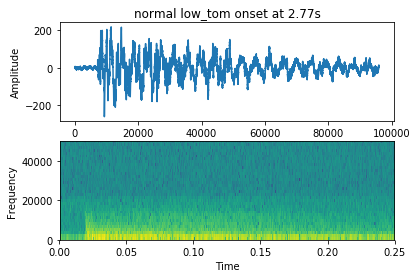

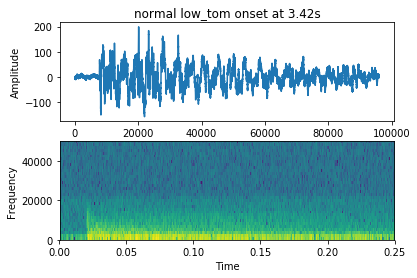

...

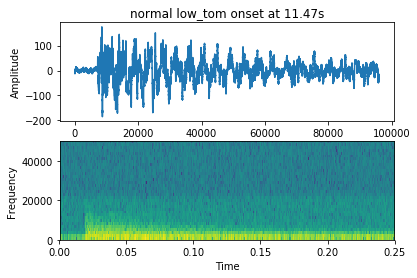

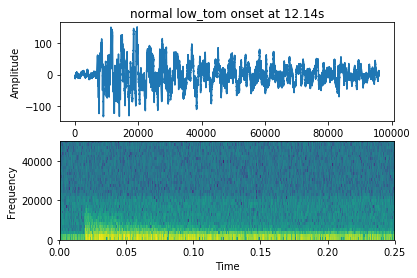

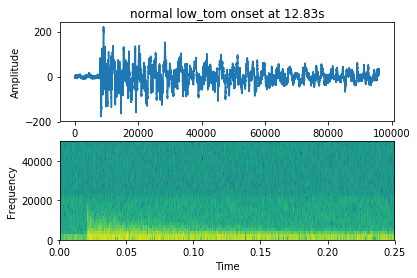

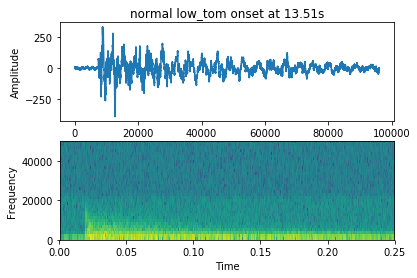

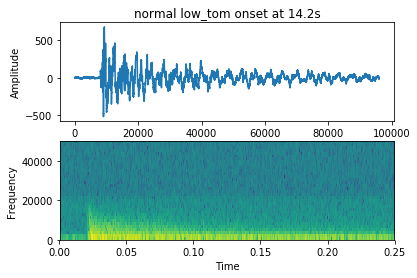

[ 202624  450304  709248  955392 1200640 1456640 1720832 1982208 2239872
 2495616 2763264 3022976 3279360 3537920 3797760 4055936 4330112]


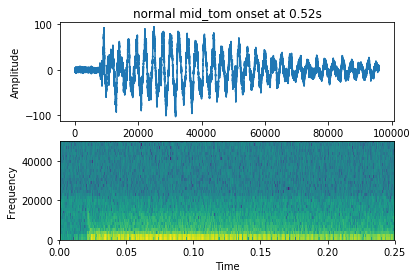

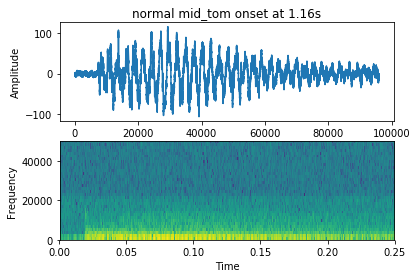

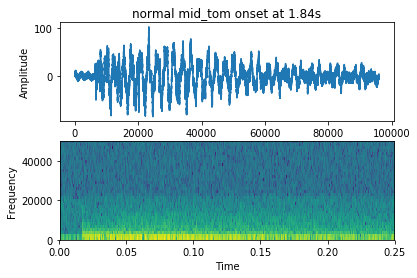

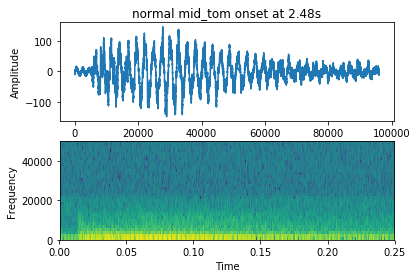

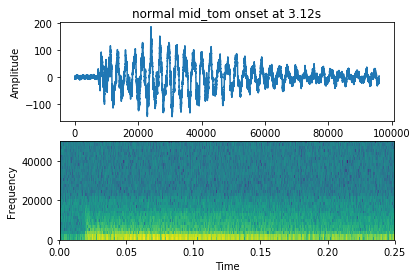

...

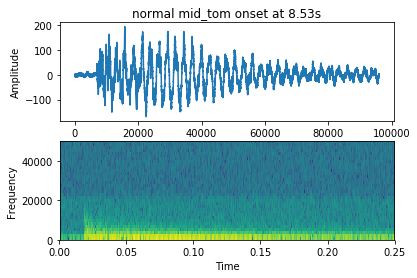

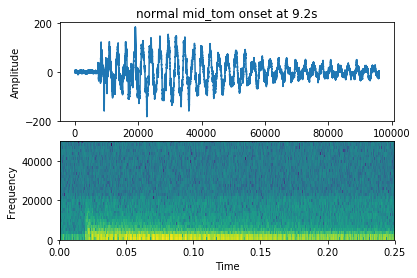

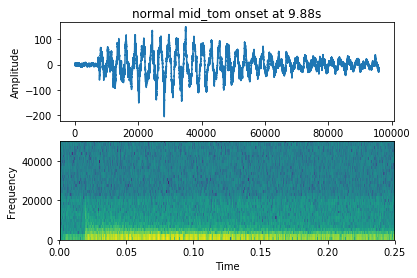

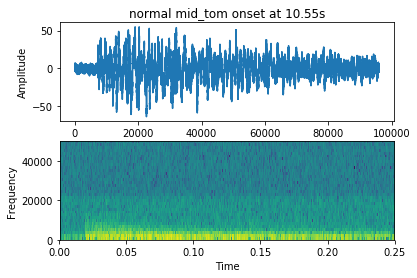

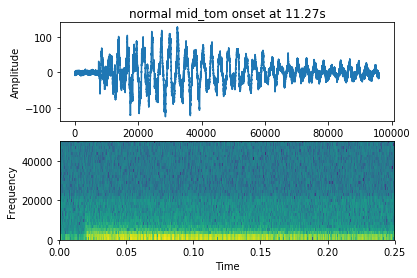

[ 216064  466944  960256 1199872 1435904 1676544 1917056 3327616 3789568
 4018816 4252160 4489088 4953600 5187968 5414528]


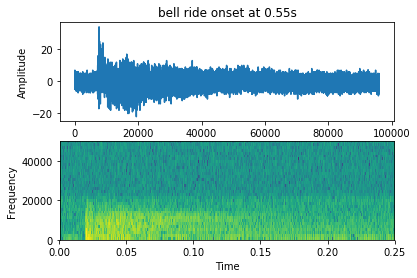

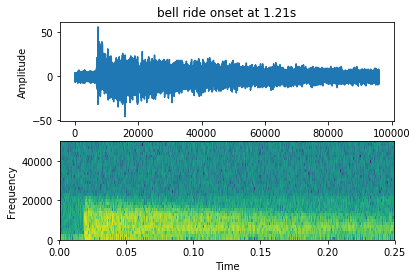

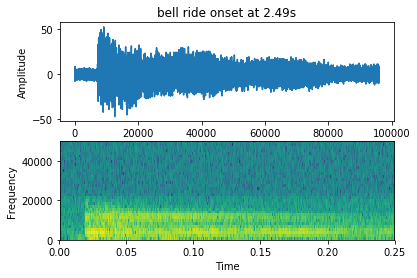

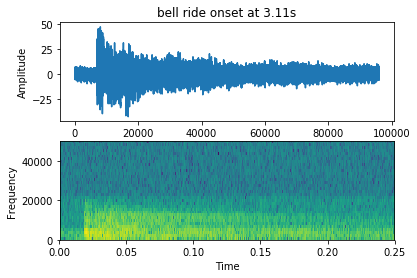

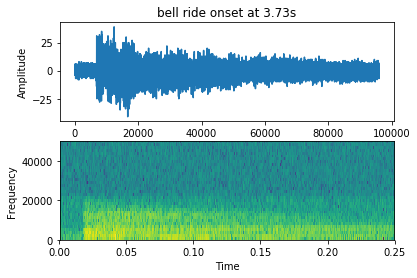

...

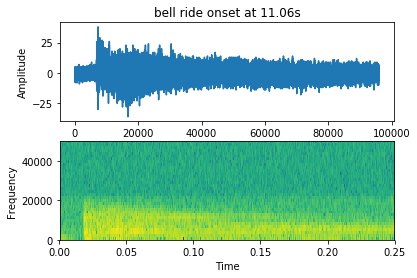

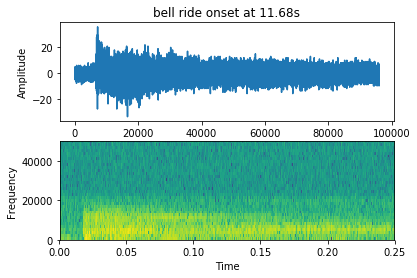

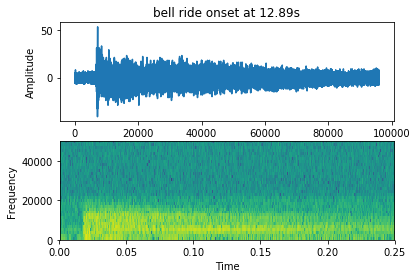

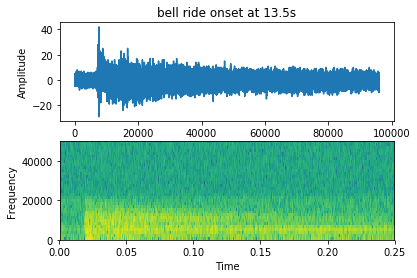

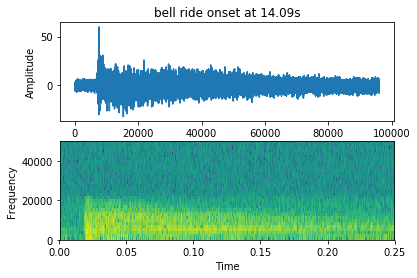

[  450048  1004928  1279488  1561216  1830784  2107648  2625664  3664768
  3946624  4792448  7563136  8365440  9721856 10245760 10503424]


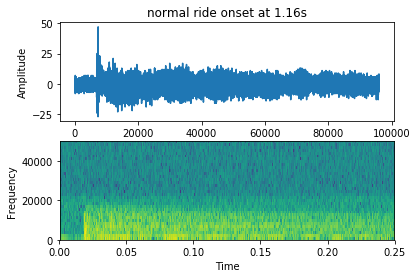

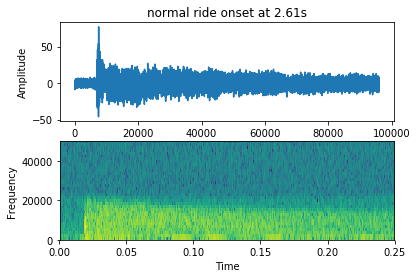

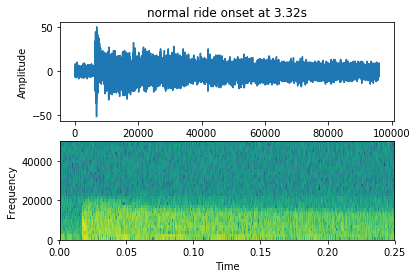

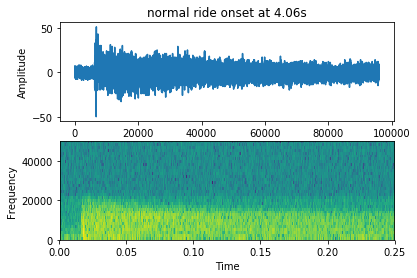

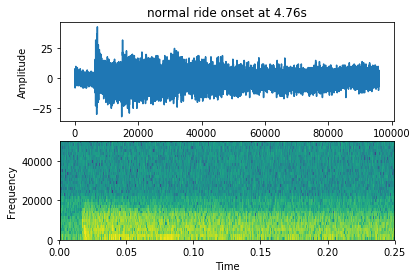

...

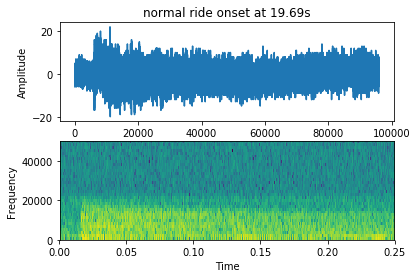

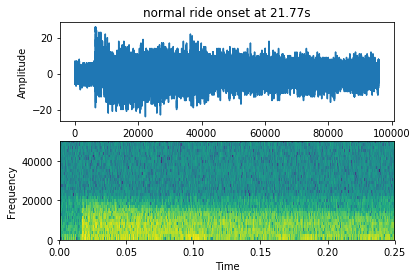

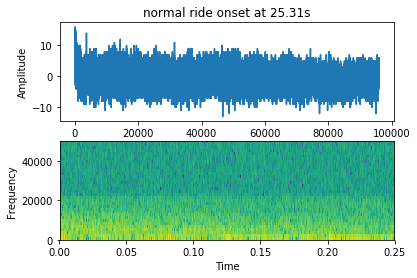

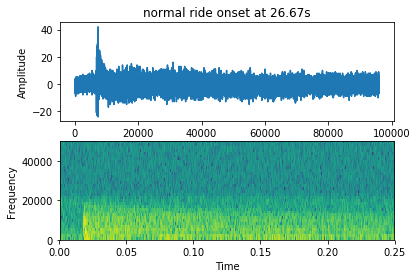

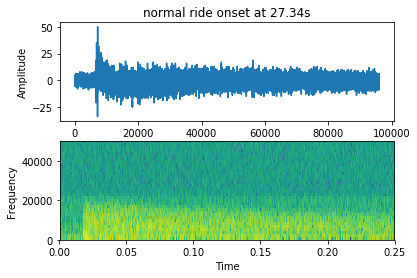

[ 399232  568064  746624  912384 1088000 1265664 1445888 1630592 1817088
 2010624 2194560 2377088 2560384 2746624 2929280 3108864 3284608 3470336
 3658368 3844352 4044288 4249088 4455040 4674048 4902784 5125120 5335936
 5541888 5755008 5976832]


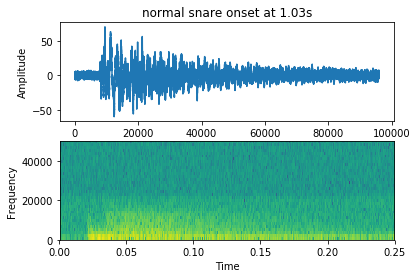

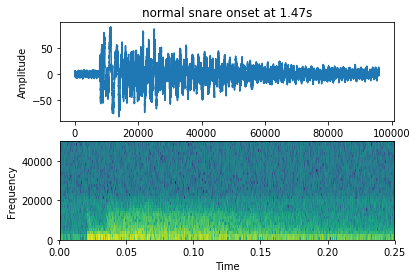

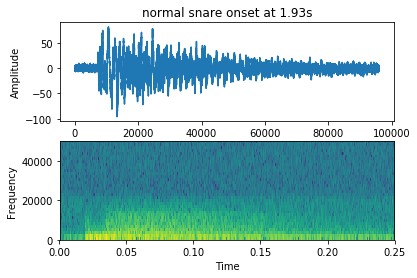

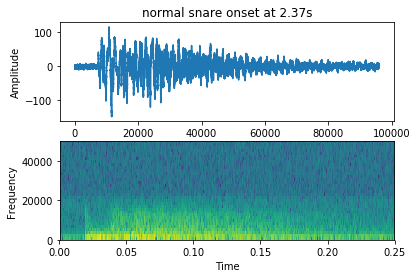

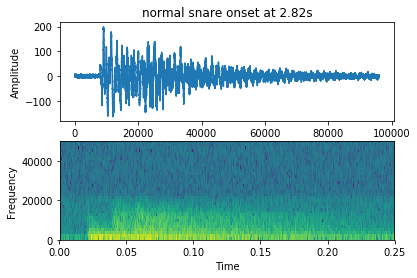

...

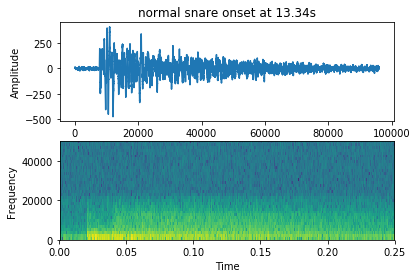

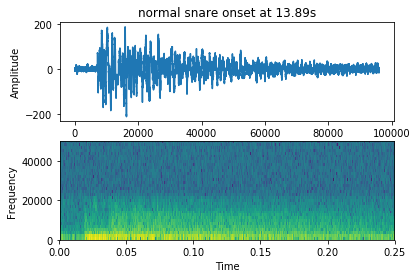

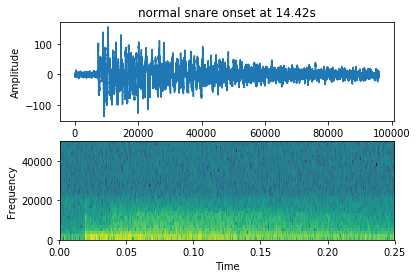

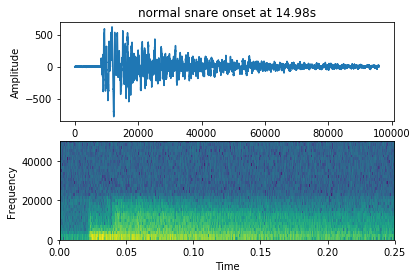

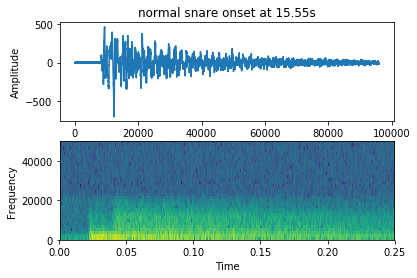

[ 254592  586368  935552 1263488 1597824 1915904 2229760 2887168 3241472
 3578368 3898752 4228992 4560896 4887808]


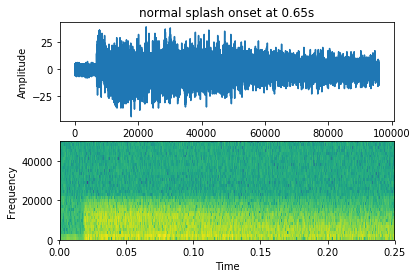

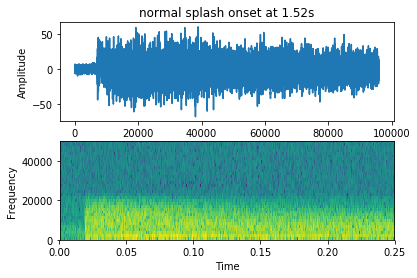

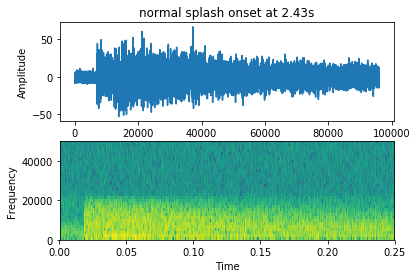

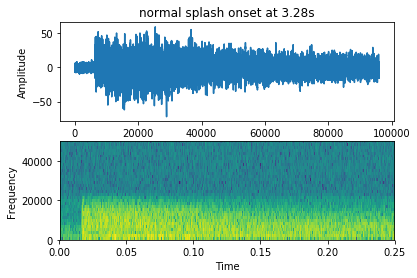

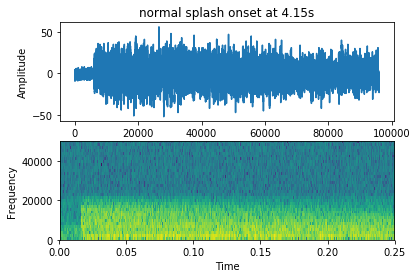

...

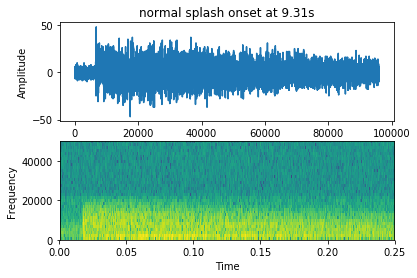

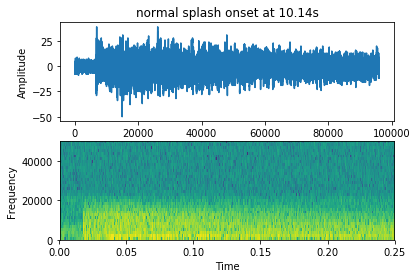

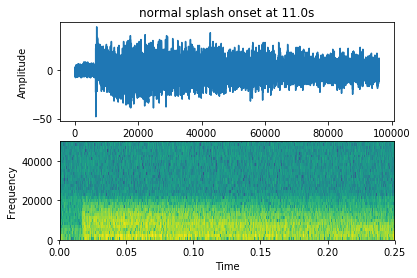

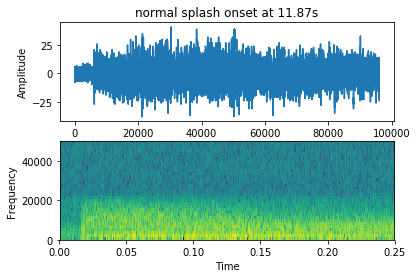

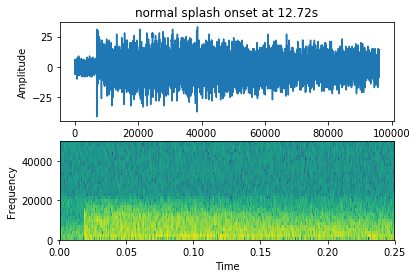

In [9]:
for i in range(len(data_indices)):
    d = data[data_indices[i]]
    labels = d.labels["tech_label"] + " " + d.labels["kit_label"]
    rd = resampled_data[i]
    onsets = np.array(rd_onsets[i])
    onsets *= int(d.rate/rd.rate)
    print(onsets)
    for onset in onsets:
        start = int(onset-0.01*d.rate)
        end = int(onset+0.24*d.rate)
        crop = np.array(d.data[start:end])
        t = round(start/data[0].rate, 2)
        plot("{} onset at {}s".format(labels, t), crop, d.rate, (0, 50000))